<a href="https://colab.research.google.com/github/Marcin19721205/Wprowadzenie-Do-Sieci-Neuronowych/blob/main/18_cnn_binary_classifier01MJ.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Konwolucyjne - klasyfikator binarny

* @author: krakowiakpawel9@gmail.com  
* @site: e-smartdata.org

### Klasyfikator binarny - Image Classification - Drone vs. Passenger Plane

1. [Import bibliotek](#a0)
2. [Załadowanie danych](#a1)
3. [Przygotowanie zbiorów: treningowego, walidacyjnego i testowego](#a2)
4. [Eksplorcja danych](#a3)
5. [Augmentacja danych](#a4)
6. [Budowa modelu](#a5)
7. [Transfer learning - model VGG16](#a6)
8. [Transfer learning - model VGG16 - odmrożenie kilku ostatnich warstw](#a7)
9. [Ocena modelu na zbiorze testowym](#a8)
10. [Wyświetlenie błędów predykcji](#a9)

### <a name='a0'></a> Import bibliotek

In [3]:
# Przygotowanie środowiska do pracy z Tensorflow 2.0.
# Jeśli otrzymasz błąd podczas instalacji Tensorflow uruchom tę komórkę raz jeszcze.

#!pip uninstall -y tensorflow
#!pip install -q tensorflow==2.19.0
#lu nowszy

In [4]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import shutil #kopiowanie
import plotly.graph_objects as go
from sklearn.metrics import confusion_matrix, classification_report

from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras import optimizers
from tensorflow.keras.callbacks import TensorBoard

np.set_printoptions(precision=6, suppress=True)

### <a name='a1'></a> Załadowanie danych

Po pobraniu zakomentuj, żeby się ponownie nie pobierało

In [5]:
!wget https://storage.googleapis.com/esmartdata-courses-files/ann-course/flying-vehicles.zip
!unzip -q flying-vehicles.zip

--2025-11-11 18:25:47--  https://storage.googleapis.com/esmartdata-courses-files/ann-course/flying-vehicles.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 172.253.118.207, 172.217.194.207, 142.251.10.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|172.253.118.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1540232238 (1.4G) [application/x-zip-compressed]
Saving to: ‘flying-vehicles.zip’

flying-vehicles.zip 100%[===================>]   1.43G  11.4MB/s    in 2m 11s  

2025-11-11 18:28:00 (11.2 MB/s) - ‘flying-vehicles.zip’ saved [1540232238/1540232238]



### <a name='a2'></a> Przygotowanie zbiorów: treningowego, walidacyjnego i testowego

Czyść katalog roboczy

In [6]:
!rm -rf ./images

Przypisanie katalogu bazowego

podaje ile plików w poszczególnych katalogach

In [7]:
base_dir = './data/planes'
raw_no_of_files = {}
classes = ['drone', 'fighter-jet', 'helicopter', 'missile', 'passenger-plane', 'rocket']
for dir in classes:
    raw_no_of_files[dir] = len(os.listdir(os.path.join(base_dir, dir)))

raw_no_of_files.items()

dict_items([('drone', 1332), ('fighter-jet', 1867), ('helicopter', 1387), ('missile', 1334), ('passenger-plane', 1424), ('rocket', 1186)])

Utworzenie katalogu z danymi: treningowy, walidacyjn, testowy

na bazie pasażerski i drony

In [8]:
data_dir = './images'#stwórz katalog images

if not os.path.exists(data_dir):
    os.mkdir(data_dir)

train_dir = os.path.join(data_dir, 'train')    # katalog zbioru treningowego
valid_dir = os.path.join(data_dir, 'valid')    # katalog zbioru walidacyjnego
test_dir = os.path.join(data_dir, 'test')      # katalog zbioru testowego

train_drone_dir = os.path.join(train_dir, 'drone')
train_passenger_dir = os.path.join(train_dir, 'passenger')

valid_drone_dir = os.path.join(valid_dir, 'drone')
valid_passenger_dir = os.path.join(valid_dir, 'passenger')

test_drone_dir = os.path.join(test_dir, 'drone')
test_passenger_dir = os.path.join(test_dir, 'passenger')

for directory in (train_dir, valid_dir, test_dir):
    if not os.path.exists(directory):
        os.mkdir(directory)

dirs = [train_drone_dir, train_passenger_dir, valid_drone_dir, valid_passenger_dir, test_drone_dir, test_passenger_dir]

for dir in dirs:
    if not os.path.exists(dir):
        os.mkdir(dir)

Przyporządkowanie ścieżek do plików aby je kopiować

In [9]:
drone_fnames = os.listdir(os.path.join(base_dir, 'drone'))
passenger_fnames = os.listdir(os.path.join(base_dir, 'passenger-plane'))

drone_fnames = [fname for fname in drone_fnames if fname.split('.')[1].lower() in ['jpg', 'png', 'jpeg']]
passenger_fnames = [fname for fname in passenger_fnames if fname.split('.')[1].lower() in ['jpg', 'png', 'jpeg']]

określenie wielkoci danych treningowych / walidacyjnych

In [10]:
size = min(len(drone_fnames), len(passenger_fnames))

train_size = int(np.floor(0.7 * size))
valid_size = int(np.floor(0.2 * size))
test_size = size - train_size - valid_size

train_idx = train_size
valid_idx = train_size + valid_size
test_idx = train_size + valid_size + test_size

Kopiowanie danych

In [11]:
for i, fname in enumerate(drone_fnames):
    if i <= train_idx:
        src = os.path.join(base_dir, 'drone', fname)
        dst = os.path.join(train_drone_dir, fname)
        shutil.copyfile(src, dst)
    elif train_idx < i <= valid_idx:
        src = os.path.join(base_dir, 'drone', fname)
        dst = os.path.join(valid_drone_dir, fname)
        shutil.copyfile(src, dst)
    elif valid_idx < i < test_idx:
        src = os.path.join(base_dir, 'drone', fname)
        dst = os.path.join(test_drone_dir, fname)
        shutil.copyfile(src, dst)

for i, fname in enumerate(passenger_fnames):
    if i <= train_idx:
        src = os.path.join(base_dir, 'passenger-plane', fname)
        dst = os.path.join(train_passenger_dir, fname)
        shutil.copyfile(src, dst)
    elif train_idx < i <= valid_idx:
        src = os.path.join(base_dir, 'passenger-plane', fname)
        dst = os.path.join(valid_passenger_dir, fname)
        shutil.copyfile(src, dst)
    elif valid_idx < i < test_idx:
        src = os.path.join(base_dir, 'passenger-plane', fname)
        dst = os.path.join(test_passenger_dir, fname)
        shutil.copyfile(src, dst)

print('drone - zbiór treningowy', len(os.listdir(train_drone_dir)))
print('drone - zbiór walidacyjny', len(os.listdir(valid_drone_dir)))
print('drone - zbiór testowy', len(os.listdir(test_drone_dir)))

print('passenger - zbiór treningowy', len(os.listdir(train_passenger_dir)))
print('passenger - zbiór walidacyjny', len(os.listdir(valid_passenger_dir)))
print('passenger - zbiór testowy', len(os.listdir(test_passenger_dir)))

drone - zbiór treningowy 919
drone - zbiór walidacyjny 262
drone - zbiór testowy 131
passenger - zbiór treningowy 919
passenger - zbiór walidacyjny 262
passenger - zbiór testowy 131


### <a name='a3'></a> Eksplorcja danych

(np.float64(-0.5), np.float64(5624.5), np.float64(3749.5), np.float64(-0.5))

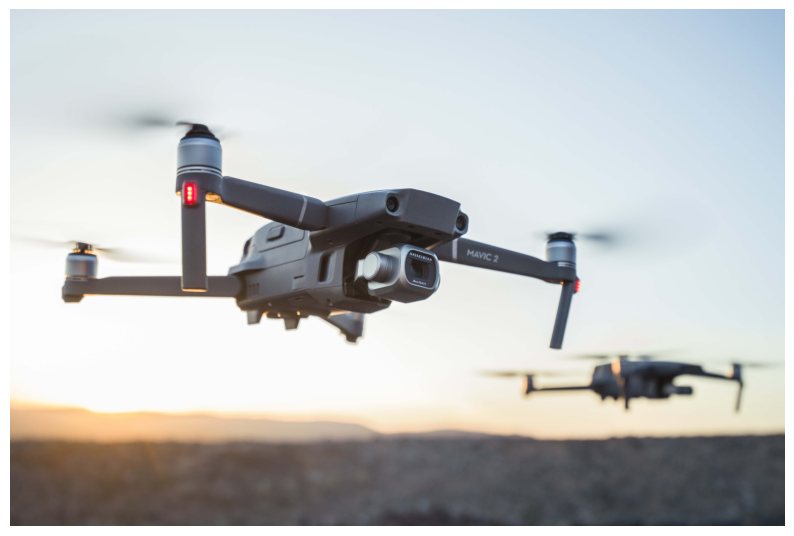

In [12]:
#@title Wybierz indeks przykładowego zdjęcia drona ze zbioru treningowego:

idx = 221 #@param {type:'slider', min:0, max:919}
names_mapping = dict(enumerate(drone_fnames))
img_path = os.path.join(train_drone_dir, names_mapping[idx])

img = image.load_img(img_path)

plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.grid(False)
plt.axis(False)

(np.float64(-0.5), np.float64(675.5), np.float64(1023.5), np.float64(-0.5))

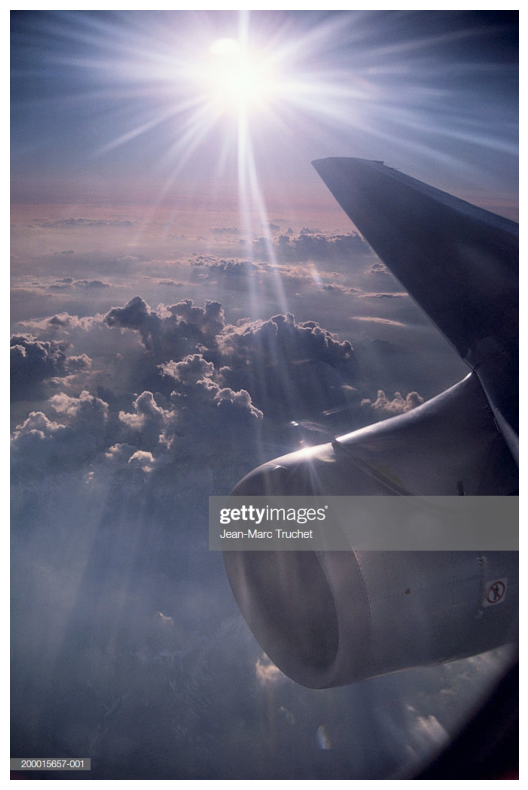

In [13]:
#@title Wybierz indeks przykładowego zdjęcia samolotu pasażerskiego ze zbioru treningowego:

idx = 387 #@param {type:'slider', min:0, max:919}
names_mapping = dict(enumerate(passenger_fnames))
img_path = os.path.join(train_passenger_dir, names_mapping[idx])

img = image.load_img(img_path)

plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.grid(False)
plt.axis(False)

### <a name='a4'></a> Augmentcja danych

trenowanie

In [14]:
train_datagen = ImageDataGenerator(
    rotation_range=40,     # zakres kąta o który losowo zostanie wykonany obrót obrazów
    rescale=1./255.,
    width_shift_range=0.2,  # pionowe przekształcenia obrazu
    height_shift_range=0.2, # poziome przekształcenia obrazu
    shear_range=0.2,        # zares losowego przycianania obrazu
    zoom_range=0.2,         # zakres losowego przybliżania obrazu
    horizontal_flip=True,   # losowe odbicie połowy obrazu w płaszczyźnie poziomej
    fill_mode='nearest'     # strategia wypełniania nowo utworzonych pikseli, któe mogą powstać w wyniku przekształceń
)

# przeskalowujemy wszystkie obrazy o współczynnik 1/255
valid_datagen = ImageDataGenerator(rescale=1./255.) # na walidacyjnym dokonujemy tylko re-scale brak innych modyfikacji!!!

train_generator = train_datagen.flow_from_directory(directory=train_dir,
                                                   target_size=(150, 150),
                                                   batch_size=32,
                                                   class_mode='binary')

valid_generator = valid_datagen.flow_from_directory(directory=valid_dir,
                                                   target_size=(150, 150),
                                                   batch_size=32,
                                                   class_mode='binary')

Found 1838 images belonging to 2 classes.
Found 524 images belonging to 2 classes.


#przygotowanie i wyswietlenie augmentowanych danych

In [15]:
def display_augmented_images(directory, idx):
    """
    Funkcja zwraca wykres przykładowych obrazów uzyskanych za pomocą techniki
    augmentacji danych.
    """
    fnames = [os.path.join(directory, fname) for fname in os.listdir(directory)]
    img_path = fnames[idx]
    img = image.load_img(img_path, target_size=(150, 150)) #przygotowane dane - tak używamy na wejciu CNN!

    x = image.img_to_array(img)
    x = x.reshape((1, ) + x.shape)

    i = 1
    plt.figure(figsize=(16, 8)) #wielkość obrazka
    for batch in train_datagen.flow(x, batch_size=1):
        plt.subplot(3, 4, i)
        plt.grid(False)
        imgplot = plt.imshow(image.array_to_img(batch[0]))
        i += 1
        if i % 13 == 0:
            break

Robi augmentacje danych - rozszerza zbiory !

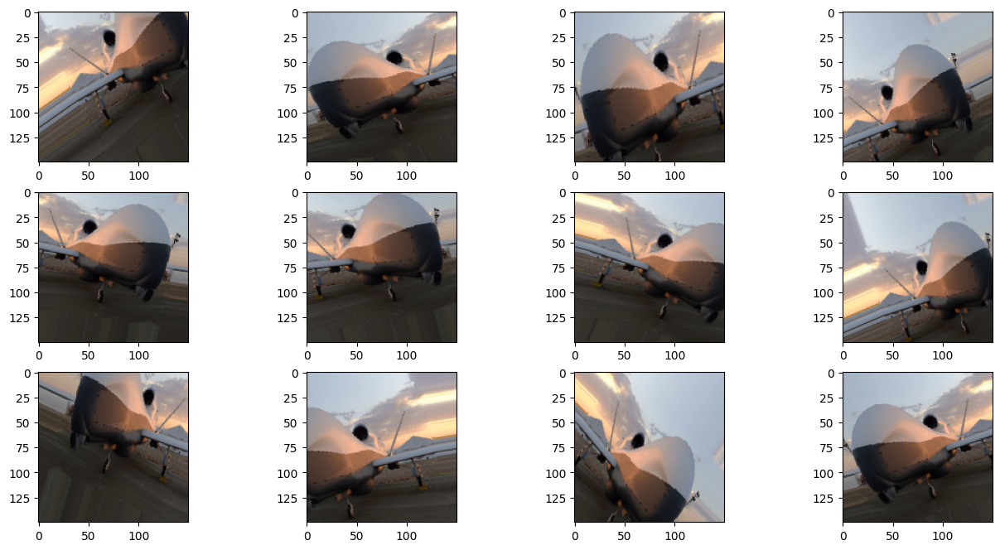

In [16]:
#@title Zbiór treningowy drone:
idx = 757 #@param {type:'slider', min:0, max:919}
display_augmented_images(train_drone_dir, idx)

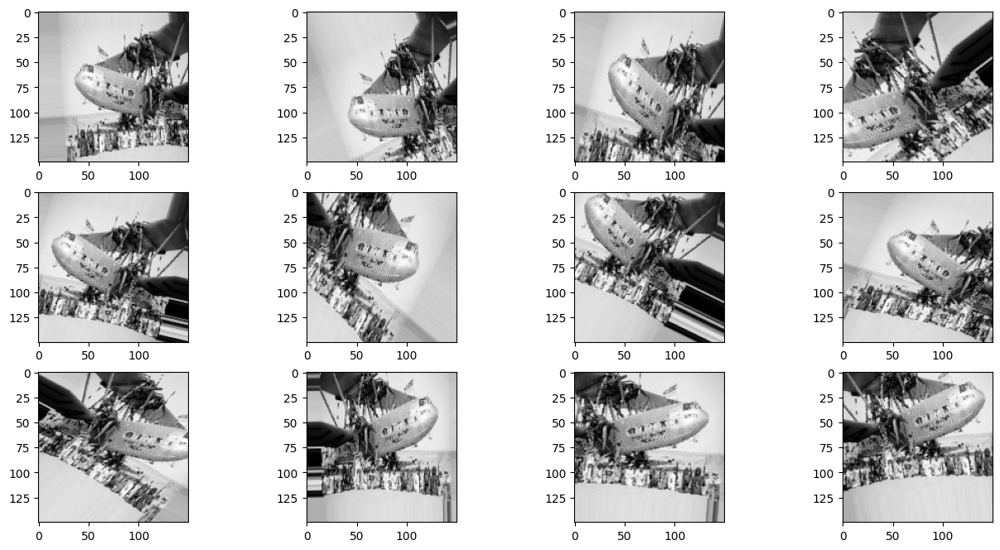

In [17]:
#@title Zbiór treningowy passenger:
idx = 390 #@param {type:'slider', min:0, max:919}
display_augmented_images(train_passenger_dir, idx)

### <a name='a5'></a> Budowa modelu

Conv2D - na

konwolucyjan zabiera 2 pixele
max pool dzieli pixele / 2

In [18]:
model = Sequential()
model.add(layers.Conv2D(filters=32, kernel_size=(3, 3), activation='relu', input_shape=(150, 150, 3))) #Wartstawa konwolocji, 32 filtry o rozmiarze 3x3 z rozmiarem 150x150 - przygotowane wyżej. 3 oznacza R+G+B - kolorowy
model.add(layers.MaxPooling2D(pool_size=(2, 2))) #okienko które pprzemieszcza się po obrazie i wyciąga max wartość pixela
model.add(layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu'))# zwiekszamy ilość filtów
model.add(layers.MaxPooling2D(pool_size=(2, 2)))
model.add(layers.Conv2D(filters=128, kernel_size=(3, 3), activation='relu'))
model.add(layers.MaxPooling2D(pool_size=(2, 2)))
model.add(layers.Conv2D(filters=128, kernel_size=(3, 3), activation='relu'))
model.add(layers.MaxPooling2D(pool_size=(2, 2))) #dotąd mamy obrazy 150x150
model.add(layers.Flatten()) #wyplaszczanie
model.add(layers.Dense(units=512, activation='relu')) #512 neuronów
model.add(layers.Dense(units=256, activation='relu')) #256 neuronów
model.add(layers.Dense(units=1, activation='sigmoid'))
model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 15, 15, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 6272)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     3,211,776 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,584,193 (13.67 MB)

 Trainable params: 3,584,193 (13.67 MB)

 Non-trainable params: 0 (0.00 B)

Kompilacja modelu

In [19]:
model.compile(optimizer=optimizers.RMSprop(learning_rate=1e-4),
             loss='binary_crossentropy',
             metrics=['accuracy'])

Tworzymy i czyscimy katalog z logami

In [20]:
!rm -rf logs
!mkdir logs

tensorboard = TensorBoard(log_dir='logs')

Trenujemy model ale za pomoca fit.generator

In [60]:
batch_size = 32
steps_per_epoch = train_size // batch_size
validation_steps = valid_size // batch_size

history = model.fit(train_generator,
                             steps_per_epoch=steps_per_epoch,
                             epochs=30,    # 100
                             validation_data=valid_generator,
                             validation_steps=validation_steps,
                             callbacks=[tensorboard])

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 25s 677ms/step - accuracy: 0.4696 - loss: 0.6972 - val_accuracy: 0.5000 - val_loss: 0.6929
Epoch 2/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 18s 681ms/step - accuracy: 0.5013 - loss: 0.6935 - val_accuracy: 0.5469 - val_loss: 0.6882
Epoch 3/30
 1/28 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - accuracy: 0.5625 - loss: 0.6872

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/epoch_iterator.py:116: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


28/28 ━━━━━━━━━━━━━━━━━━━━ 5s 201ms/step - accuracy: 0.5776 - loss: 0.6849 - val_accuracy: 0.5273 - val_loss: 0.6897
Epoch 4/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 17s 567ms/step - accuracy: 0.5404 - loss: 0.6890 - val_accuracy: 0.5781 - val_loss: 0.6813
Epoch 5/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 16s 585ms/step - accuracy: 0.5500 - loss: 0.6895 - val_accuracy: 0.5703 - val_loss: 0.6763
Epoch 6/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 92ms/step - accuracy: 0.5798 - loss: 0.6863 - val_accuracy: 0.5508 - val_loss: 0.6814
Epoch 7/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 17s 600ms/step - accuracy: 0.5439 - loss: 0.6869 - val_accuracy: 0.5508 - val_loss: 0.6830
Epoch 8/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 16s 600ms/step - accuracy: 0.5495 - loss: 0.6875 - val_accuracy: 0.5742 - val_loss: 0.6709
Epoch 9/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - accuracy: 0.5798 - loss: 0.6796 - val_accuracy: 0.6172 - val_loss: 0.6732
Epoch 10/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 16s 556ms/step - accuracy: 0.5904 - loss: 0.6717 - val_accuracy: 0.5508 - 

In [61]:
%load_ext tensorboard

In [66]:
#!tensorboard dev upload --logdir logs

%load_ext tensorboard
%tensorboard --logdir logs --host localhost --port 6006
# model.fit(X_train, y_train, epochs=10, validation_data=(X_val, y_val), callbacks=[tb])

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [38]:
def plot_hist(history):
    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch

    fig = go.Figure()
    fig.add_trace(go.Scatter(x=hist['epoch'], y=hist['accuracy'], name='accuracy', mode='markers+lines'))
    fig.add_trace(go.Scatter(x=hist['epoch'], y=hist['val_accuracy'], name='val_accuracy', mode='markers+lines'))
    fig.update_layout(width=1000, height=500, title='Accuracy vs. Val Accuracy', xaxis_title='Epoki', yaxis_title='Accuracy', yaxis_type='log')
    fig.show()

    fig = go.Figure()
    fig.add_trace(go.Scatter(x=hist['epoch'], y=hist['loss'], name='loss', mode='markers+lines'))
    fig.add_trace(go.Scatter(x=hist['epoch'], y=hist['val_loss'], name='val_loss', mode='markers+lines'))
    fig.update_layout(width=1000, height=500, title='Loss vs. Val Loss', xaxis_title='Epoki', yaxis_title='Loss', yaxis_type='log')
    fig.show()

plot_hist(history)

### <a name='a6'></a> Transfer learning - model VGG16

Lepszy model przy niewielkim zbiorze

In [21]:
from tensorflow.keras.applications import VGG16

conv_base = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3)) #imagenet jest to przetenowany zbiór milionów zdjęć
conv_base.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 18, 18, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

Do modelu VGG16 dodajemy nasz model (model.add(conv_base)!
#Baza całego modelu VGG16 + nasz

In [22]:
model = Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(units=256, activation='relu'))
model.add(layers.Dense(units=1, activation='sigmoid'))
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 4, 4, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 256)            │     2,097,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,812,353 (64.13 MB)

 Trainable params: 16,812,353 (64.13 MB)

 Non-trainable params: 0 (0.00 B)

#Mrożenie wartsw VGG16

In [23]:
print(f'Liczba warstw trenowanych przed zamrożeniem {len(model.trainable_weights)}')
conv_base.trainable = False #zamrażamy wartstwy VGG16 - one są już przetrenowane
print(f'Liczba warstw trenowanych po zamrożeniu {len(model.trainable_weights)}')

Liczba warstw trenowanych przed zamrożeniem 30
Liczba warstw trenowanych po zamrożeniu 4


Kompiluj model

In [24]:
model.compile(optimizer=optimizers.RMSprop(learning_rate=1e-4),
             loss='binary_crossentropy',
             metrics=['accuracy'])

In [26]:
batch_size = 32
steps_per_epoch = train_size // batch_size
validation_steps = valid_size // batch_size

history = model.fit(train_generator,
                             steps_per_epoch=steps_per_epoch,
                             epochs=50,    # 100
                             validation_data=valid_generator,
                             validation_steps=validation_steps,
                             callbacks=[tensorboard])

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 33s 778ms/step - accuracy: 0.6000 - loss: 0.6922 - val_accuracy: 0.7578 - val_loss: 0.4939
Epoch 2/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 15s 542ms/step - accuracy: 0.7123 - loss: 0.5660 - val_accuracy: 0.8008 - val_loss: 0.4327
Epoch 3/50
 2/28 ━━━━━━━━━━━━━━━━━━━━ 2s 101ms/step - accuracy: 0.8516 - loss: 0.4369

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/epoch_iterator.py:116: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - accuracy: 0.8588 - loss: 0.4294 - val_accuracy: 0.6875 - val_loss: 0.5821
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 17s 590ms/step - accuracy: 0.7444 - loss: 0.4879 - val_accuracy: 0.8086 - val_loss: 0.4239
Epoch 5/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 15s 552ms/step - accuracy: 0.7137 - loss: 0.5395 - val_accuracy: 0.8086 - val_loss: 0.4061
Epoch 6/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 107ms/step - accuracy: 0.7015 - loss: 0.5225 - val_accuracy: 0.8164 - val_loss: 0.3707
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 17s 579ms/step - accuracy: 0.7298 - loss: 0.5023 - val_accuracy: 0.8047 - val_loss: 0.3851
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 16s 577ms/step - accuracy: 0.7156 - loss: 0.5048 - val_accuracy: 0.8047 - val_loss: 0.4154
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 95ms/step - accuracy: 0.7327 - loss: 0.4131 - val_accuracy: 0.8047 - val_loss: 0.4429
Epoch 10/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 18s 642ms/step - accuracy: 0.7406 - loss: 0.5040 - val_accuracy: 0.7891 -

In [29]:
import plotly.graph_objects as go
plot_hist(history)

### <a name='a7'></a> Transfer learning - model VGG16 - odmrożenie kilku ostatnich warstw

Odmrażamy i ustawiamy, że będą trenowane wszystkie wartsty VGG16

In [30]:
conv_base = VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))
conv_base.trainable = True

def print_layers(model):
    for layer in model.layers:
        print(f'layer_name: {layer.name:13} trainable: {layer.trainable}')

print_layers(conv_base)

layer_name: input_layer_3 trainable: True
layer_name: block1_conv1  trainable: True
layer_name: block1_conv2  trainable: True
layer_name: block1_pool   trainable: True
layer_name: block2_conv1  trainable: True
layer_name: block2_conv2  trainable: True
layer_name: block2_pool   trainable: True
layer_name: block3_conv1  trainable: True
layer_name: block3_conv2  trainable: True
layer_name: block3_conv3  trainable: True
layer_name: block3_pool   trainable: True
layer_name: block4_conv1  trainable: True
layer_name: block4_conv2  trainable: True
layer_name: block4_conv3  trainable: True
layer_name: block4_pool   trainable: True
layer_name: block5_conv1  trainable: True
layer_name: block5_conv2  trainable: True
layer_name: block5_conv3  trainable: True
layer_name: block5_pool   trainable: True


od wartstwy block5_conf odrażamy, resztę zamrażamy

In [31]:
set_trainable = False
for layer in conv_base.layers:
    if layer.name == 'block5_conv1':
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

print_layers(conv_base)

layer_name: input_layer_3 trainable: False
layer_name: block1_conv1  trainable: False
layer_name: block1_conv2  trainable: False
layer_name: block1_pool   trainable: False
layer_name: block2_conv1  trainable: False
layer_name: block2_conv2  trainable: False
layer_name: block2_pool   trainable: False
layer_name: block3_conv1  trainable: False
layer_name: block3_conv2  trainable: False
layer_name: block3_conv3  trainable: False
layer_name: block3_pool   trainable: False
layer_name: block4_conv1  trainable: False
layer_name: block4_conv2  trainable: False
layer_name: block4_conv3  trainable: False
layer_name: block4_pool   trainable: False
layer_name: block5_conv1  trainable: True
layer_name: block5_conv2  trainable: True
layer_name: block5_conv3  trainable: True
layer_name: block5_pool   trainable: True


In [34]:
model = Sequential()
model.add(conv_base) #dodajemy conv_base z odmrożonymi ostatnimi
model.add(layers.Flatten()) #wypłaszczamy dane
model.add(layers.Dense(units=256, activation='relu'))
model.add(layers.Dense(units=1, activation='sigmoid'))

model.compile(optimizer=optimizers.RMSprop(learning_rate=1e-5),
             loss='binary_crossentropy',
             metrics=['accuracy'])

model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 4, 4, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 256)            │     2,097,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,812,353 (64.13 MB)

 Trainable params: 9,177,089 (35.01 MB)

 Non-trainable params: 7,635,264 (29.13 MB)

In [35]:
batch_size = 32
steps_per_epoch = train_size // batch_size
validation_steps = valid_size // batch_size

history = model.fit(train_generator,
                             steps_per_epoch=steps_per_epoch,
                             epochs=30,    # 100
                             validation_data=valid_generator,
                             validation_steps=validation_steps,
                             callbacks=[tensorboard])




#history = model.fit(train_generator,
 #                            steps_per_epoch=steps_per_epoch,
  #                           epochs=50,    # 100
   #                          validation_data=valid_generator,
    #                         validation_steps=validation_steps,
     #                        callbacks=[tensorboard])

Epoch 1/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 24s 694ms/step - accuracy: 0.5584 - loss: 0.6798 - val_accuracy: 0.7617 - val_loss: 0.5422
Epoch 2/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 17s 625ms/step - accuracy: 0.6914 - loss: 0.5801 - val_accuracy: 0.7812 - val_loss: 0.4783
Epoch 3/30
 2/28 ━━━━━━━━━━━━━━━━━━━━ 3s 123ms/step - accuracy: 0.7188 - loss: 0.5202

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/epoch_iterator.py:116: UserWarning:

Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.



28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step - accuracy: 0.7188 - loss: 0.5362 - val_accuracy: 0.8477 - val_loss: 0.4104
Epoch 4/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 20s 716ms/step - accuracy: 0.7257 - loss: 0.5421 - val_accuracy: 0.8125 - val_loss: 0.4312
Epoch 5/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 17s 616ms/step - accuracy: 0.7789 - loss: 0.4819 - val_accuracy: 0.7500 - val_loss: 0.4560
Epoch 6/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 103ms/step - accuracy: 0.7026 - loss: 0.4768 - val_accuracy: 0.8008 - val_loss: 0.4144
Epoch 7/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 18s 626ms/step - accuracy: 0.7866 - loss: 0.4421 - val_accuracy: 0.7969 - val_loss: 0.4154
Epoch 8/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 17s 625ms/step - accuracy: 0.8018 - loss: 0.4217 - val_accuracy: 0.7891 - val_loss: 0.4519
Epoch 9/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - accuracy: 0.7963 - loss: 0.3896 - val_accuracy: 0.8047 - val_loss: 0.3877
Epoch 10/30
28/28 ━━━━━━━━━━━━━━━━━━━━ 16s 547ms/step - accuracy: 0.7858 - loss: 0.4470 - val_accuracy: 0.7891 - 

In [36]:
plot_hist(history)

### <a name='a8'></a> Ocena modelu na zbiorze testowym

In [40]:
test_datagen = ImageDataGenerator(rescale=1./255.)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(150, 150),
    batch_size=1,
    class_mode='binary',
    shuffle=False
)

y_prob = model.predict(test_generator, steps=test_generator.samples)
y_prob = y_prob.ravel()
y_prob

Found 262 images belonging to 2 classes.
 11/262 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning:

Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.



262/262 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step


array([0.000312, 0.096019, 0.003298, 0.000259, 0.002919, 0.014505,
       0.482675, 0.012207, 0.018916, 0.224455, 0.066126, 0.028739,
       0.007711, 0.547871, 0.013384, 0.080817, 0.011785, 0.000148,
       0.010809, 0.033807, 0.008235, 0.002021, 0.003443, 0.701462,
       0.012255, 0.005981, 0.00031 , 0.163166, 0.239404, 0.32625 ,
       0.01723 , 0.037364, 0.038112, 0.004109, 0.00003 , 0.051337,
       0.343742, 0.018606, 0.004153, 0.004809, 0.391196, 0.324014,
       0.006101, 0.000626, 0.072519, 0.001507, 0.00548 , 0.867423,
       0.083741, 0.001731, 0.001233, 0.097594, 0.404148, 0.211816,
       0.134938, 0.00408 , 0.038923, 0.008361, 0.013284, 0.005295,
       0.065715, 0.202995, 0.004699, 0.008534, 0.075497, 0.032992,
       0.138807, 0.317632, 0.030405, 0.080471, 0.304085, 0.32625 ,
       0.288961, 0.002815, 0.233479, 0.371819, 0.043394, 0.008035,
       0.613027, 0.119042, 0.026167, 0.123246, 0.218365, 0.489504,
       0.398156, 0.793599, 0.193017, 0.135911, 0.165551, 0.005

In [42]:
predictions  = pd.DataFrame({'y_prob': y_prob})
predictions['class'] = predictions['y_prob'].apply(lambda x: 1 if x > 0.5 else 0)
predictions

,y_prob,class
0,0.000312,0
1,0.096019,0
2,0.003298,0
3,0.000259,0
4,0.002919,0
...,...,...
257,0.990185,1
258,0.789806,1
259,0.990027,1
260,0.567088,1


Klasy prawdziwe

In [43]:
y_true = test_generator.classes
y_true

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
      dtype=int32)

klasy z predykcji

In [44]:
y_pred = predictions['class'].values
y_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

Indeksy klas

In [45]:
test_generator.class_indices

{'drone': 0, 'passenger': 1}

Macierz konfuzji

In [46]:
cm = confusion_matrix(y_true, y_pred)
cm

array([[117,  14],
       [ 20, 111]])

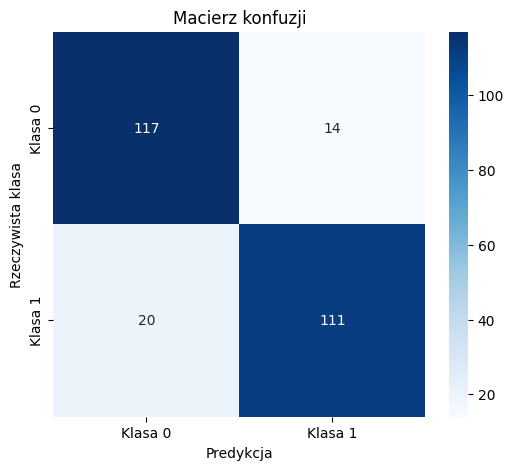

In [48]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Jeśli nie masz, oblicz jeszcze raz:
# cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Klasa 0', 'Klasa 1'],
            yticklabels=['Klasa 0', 'Klasa 1'])
plt.title('Macierz konfuzji')
plt.xlabel('Predykcja')
plt.ylabel('Rzeczywista klasa')
plt.show()


In [49]:
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       0.85      0.89      0.87       131
           1       0.89      0.85      0.87       131

    accuracy                           0.87       262
   macro avg       0.87      0.87      0.87       262
weighted avg       0.87      0.87      0.87       262



### <a name='a9'></a> Wyświetlenie błędów predykcji

In [51]:
errors = pd.DataFrame({'y_true': y_true, 'y_pred': y_pred}, index=test_generator.filenames)
errors.head()

,y_true,y_pred
drone/00000000.jpg,0,0
drone/00000001.jpg,0,0
drone/00000015.jpeg,0,0
drone/00000041.jpg,0,0
drone/00000075.jpg,0,0


Wyświetla pliki, które źle zidentyfikował

In [52]:
errors['is_incorrect'] = (errors['y_true'] != errors['y_pred']) * 1
errors

,y_true,y_pred,is_incorrect
drone/00000000.jpg,0,0,0
drone/00000001.jpg,0,0,0
drone/00000015.jpeg,0,0,0
drone/00000041.jpg,0,0,0
drone/00000075.jpg,0,0,0
...,...,...,...
passenger/00001442.jpg,1,1,0
passenger/00001458.jpg,1,1,0
passenger/00001462.jpg,1,1,0
passenger/00001474.jpg,1,1,0


In [53]:
errors[errors['is_incorrect'] == 1].index

Index(['drone/00000151.jpg', 'drone/00000312.jpg', 'drone/00000625.jpg',
       'drone/00000869.jpg', 'drone/00000963.jpg', 'drone/00001153.jpg',
       'drone/00001184.jpg', 'drone/00001191.jpg', 'drone/00001199.jpg',
       'drone/00001240.jpg', 'drone/00001248.png', 'drone/00001325.jpg',
       'drone/00001352.jpg', 'drone/00001365.jpg', 'passenger/00000071.jpg',
       'passenger/00000181.jpg', 'passenger/00000294.jpg',
       'passenger/00000352.jpg', 'passenger/00000470.jpg',
       'passenger/00000492.jpg', 'passenger/00000507.jpg',
       'passenger/00000558.jpg', 'passenger/00000642.jpg',
       'passenger/00000682.jpg', 'passenger/00000687.jpg',
       'passenger/00000785.jpg', 'passenger/00001036.jpg',
       'passenger/00001053.jpg', 'passenger/00001064.jpg',
       'passenger/00001111.jpg', 'passenger/00001158.jpg',
       'passenger/00001177.jpg', 'passenger/00001180.jpg',
       'passenger/00001248.jpg'],
      dtype='object')

Można przeglądać zdjęcia i śmieci na tym etapie powyrzucać

potem ponownie przetrenowac jeszcze raz sieć

(np.float64(-0.5), np.float64(549.5), np.float64(438.5), np.float64(-0.5))

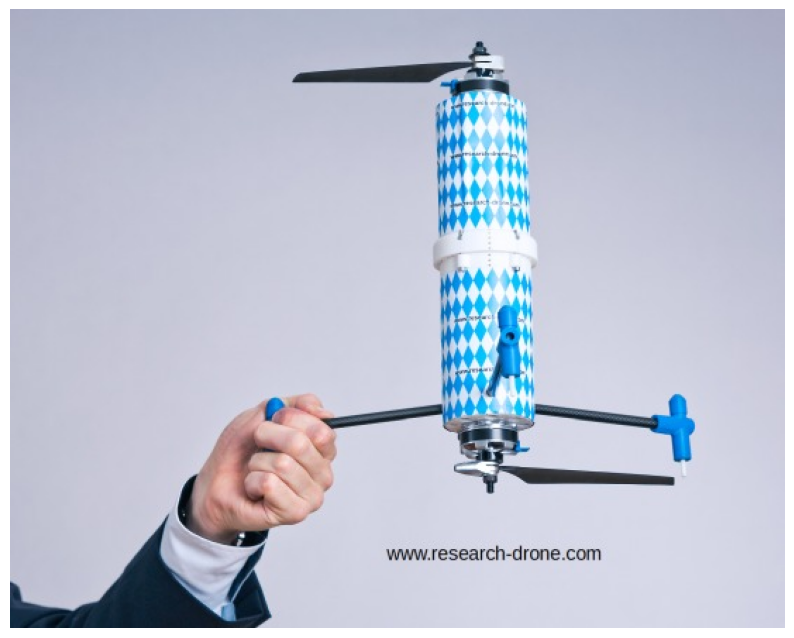

In [59]:
img_path = os.path.join(test_drone_dir, '00000625.jpg')

img = image.load_img(img_path)

plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.grid(False)
plt.axis(False)

In [60]:
errors[errors['is_incorrect'] == 1].index

Index(['drone/00000151.jpg', 'drone/00000312.jpg', 'drone/00000625.jpg',
       'drone/00000869.jpg', 'drone/00000963.jpg', 'drone/00001153.jpg',
       'drone/00001184.jpg', 'drone/00001191.jpg', 'drone/00001199.jpg',
       'drone/00001240.jpg', 'drone/00001248.png', 'drone/00001325.jpg',
       'drone/00001352.jpg', 'drone/00001365.jpg', 'passenger/00000071.jpg',
       'passenger/00000181.jpg', 'passenger/00000294.jpg',
       'passenger/00000352.jpg', 'passenger/00000470.jpg',
       'passenger/00000492.jpg', 'passenger/00000507.jpg',
       'passenger/00000558.jpg', 'passenger/00000642.jpg',
       'passenger/00000682.jpg', 'passenger/00000687.jpg',
       'passenger/00000785.jpg', 'passenger/00001036.jpg',
       'passenger/00001053.jpg', 'passenger/00001064.jpg',
       'passenger/00001111.jpg', 'passenger/00001158.jpg',
       'passenger/00001177.jpg', 'passenger/00001180.jpg',
       'passenger/00001248.jpg'],
      dtype='object')

(np.float64(-0.5), np.float64(799.5), np.float64(499.5), np.float64(-0.5))

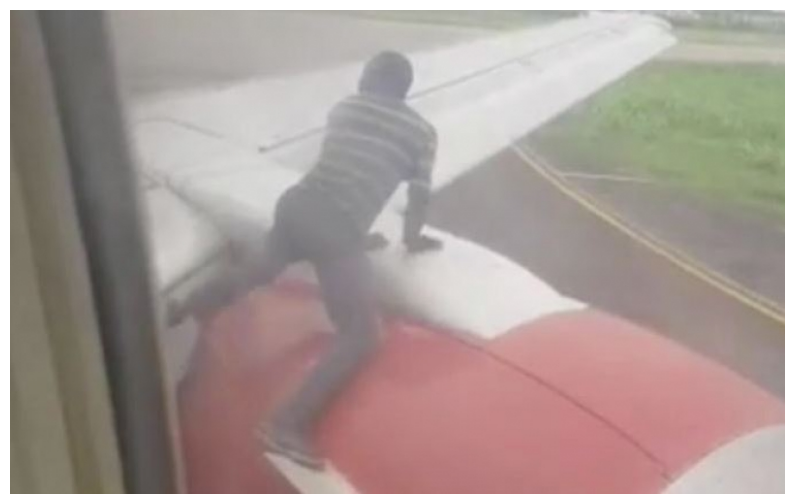

In [63]:
img_path = os.path.join(test_passenger_dir, '00000352.jpg')

img = image.load_img(img_path)

plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.grid(False)
plt.axis(False)